In [1]:
# Import required libraries
import pandas as pd
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns
from scipy import stats
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
from matplotlib.contour import QuadContourSet

In [2]:
# load dataset
data = pd.read_csv('../data/train.csv')

In [3]:
# Display basic information about the dataset
print("Dataset Shape:", data.shape)
print("\nFeature Names:")
print(data.columns.tolist())
print("\nSample of the data:")
display(data.head())

Dataset Shape: (263256, 18)

Feature Names:
['block', 'utterance', 'speaker', 'gender', 'digit', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12']

Sample of the data:


,block,utterance,speaker,gender,digit,0,1,2,3,4,5,6,7,8,9,10,11,12
0,1,1,1,m,0,-0.81101,-7.2382,1.5429,-0.64774,1.42710,0.61356,0.365160,0.088906,0.47031,0.98844,0.044692,0.20817,0.51140
1,1,1,1,m,0,-0.37028,-7.1336,1.8856,-0.34316,0.96733,0.32763,0.429880,0.504790,0.41533,0.28804,0.086109,0.62690,0.78115
2,1,1,1,m,0,0.59659,-8.3059,1.6943,-0.66611,0.34967,-0.17425,0.820770,1.261100,0.41653,0.50050,0.571630,0.45316,0.64465
3,1,1,1,m,0,1.45850,-8.1957,1.8454,-1.14960,0.82660,-0.51313,0.067443,0.256370,0.11500,-0.10915,0.085991,0.69064,0.33769
4,1,1,1,m,0,2.08240,-8.6670,1.1995,-1.12400,1.24450,-0.10251,0.998670,0.571740,1.03840,0.17564,-0.032857,0.53229,0.32941


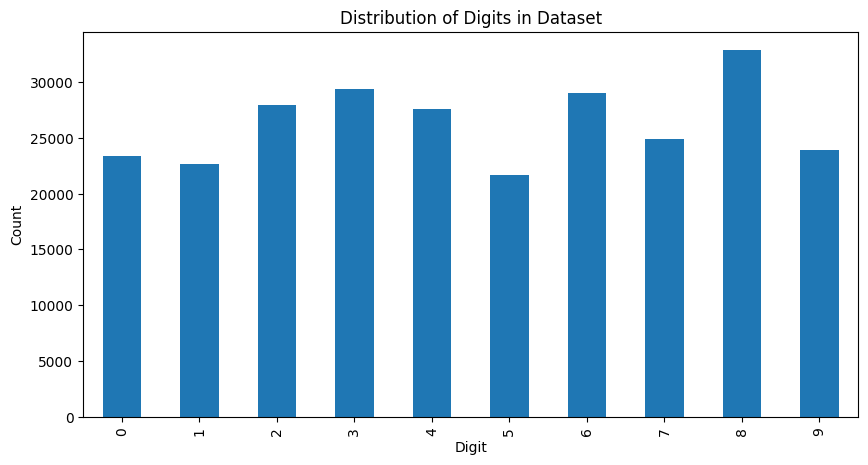

In [4]:
# Check class distribution
plt.figure(figsize=(10, 5))
data['digit'].value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of Digits in Dataset')
plt.xlabel('Digit')
plt.ylabel('Count')
plt.show()

In [5]:
def plot_mfcc_distributions(data):
    # Define the range of MFCC columns (adjust based on your data's actual range)
    mfcc_cols = data.iloc[:, 6:19].columns  # Get MFCC column names
    plt.figure(figsize=(12, 16))  # Increased figure size for better readability
    
    # Create subplots for each MFCC feature
    for i, col in enumerate(mfcc_cols):
        ax = plt.subplot(8, 2, i+1)
        
        # Plot KDE with 'hue' to separate by 'digit' and manually handle legends
        sns.kdeplot(data=data, x=col, hue='digit', common_norm=False, alpha=0.6, ax=ax, palette='Set2', legend=True)
        
        ax.set_title(f'MFCC {int(col)+1}', fontsize=12, pad=10)
        ax.set_xlabel('MFCC Value', fontsize=10)
        ax.set_ylabel('Density', fontsize=10)
        
        # Add grid for better visualization of distributions
        ax.grid(True, linestyle='--', alpha=0.7)
        
        # show legends for only the first plot and in 7 columns
        if i == 0:
            ax.legend(title='Digit', loc='upper right', labels=[f'{i}' for i in range(10)], ncol=7)
        else:
            ax.get_legend().remove()
        
    # Add a general title for the entire figure
    plt.suptitle('MFCC Distributions for Spoken Digits', fontsize=16, y=1.03)
    
    # Adjust layout for better spacing and avoid overlap
    plt.tight_layout()
    plt.show()

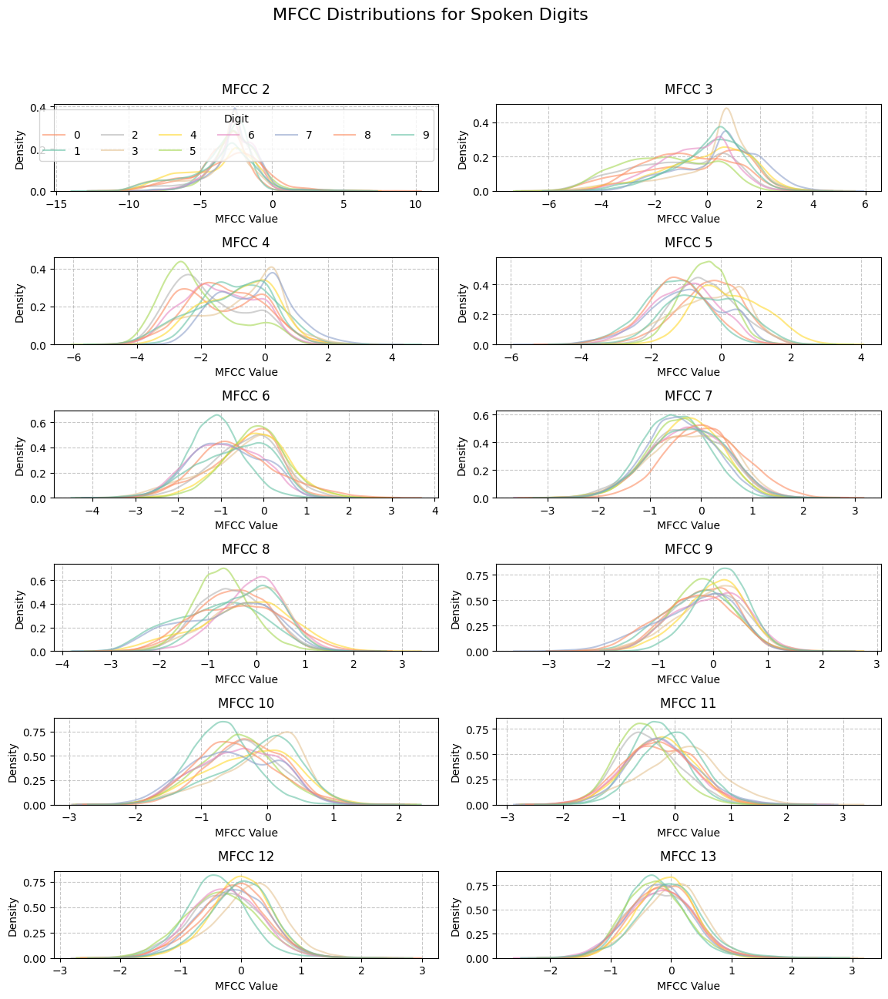

In [6]:
# Visualize MFCC distributions
plot_mfcc_distributions(data)

In [7]:
# GMM Analysis class
class GMMAnalyzer:
    def __init__(self, n_components=3):
        self.n_components = n_components
        self.gmms = {}
        self.scaler = StandardScaler()
        
    def fit_gmms(self, data):
        """
        Fit GMM for each digit using K-means initialization
        """
        # Scale the MFCC features
        mfcc_features = data.iloc[:, 6:19].values
        self.scaled_features = self.scaler.fit_transform(mfcc_features)
        
        # Store feature names for plotting
        self.feature_names = data.iloc[:, 6:19].columns
        
        # Fit GMM for each digit
        for digit in range(10):
            print(f"Fitting GMM for digit {digit}...")
            
            # Get data for current digit
            digit_mask = data['digit'] == digit
            digit_data = self.scaled_features[digit_mask]
            
            # Initialize with K-means
            kmeans = KMeans(n_clusters=self.n_components, random_state=42)
            kmeans.fit(digit_data)
            
            # Fit GMM
            gmm = GaussianMixture(
                n_components=self.n_components,
                covariance_type='full',
                random_state=42,
                means_init=kmeans.cluster_centers_
            )
            gmm.fit(digit_data)
            self.gmms[digit] = gmm
            
        print("GMM fitting completed!")
    
    def plot_gmm_contours(self, data, digit):
        """
        Create contour plots for pairs of MFCC features for a specific digit
        """
        mfcc_pairs = [(0, 1), (0, 2), (1, 2)]
        digit_mask = data['digit'] == digit
        digit_data = self.scaled_features[digit_mask]
        
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        fig.suptitle(f'GMM Contours for Digit {digit}', fontsize=14)
        
        for idx, (i, j) in enumerate(mfcc_pairs):
            # Create mesh grid
            x_min, x_max = digit_data[:, i].min() - 1, digit_data[:, i].max() + 1
            y_min, y_max = digit_data[:, j].min() - 1, digit_data[:, j].max() + 1
            xx, yy = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
            
            # Prepare data for GMM scoring
            pos = np.empty((xx.ravel().shape[0], self.scaled_features.shape[1]))
            pos[:] = np.mean(digit_data, axis=0)
            pos[:, i] = xx.ravel()
            pos[:, j] = yy.ravel()
            
            # Score samples
            scores = self.gmms[digit].score_samples(pos)
            scores = scores.reshape(xx.shape)
            
            # Plot
            ax = axes[idx]
            ax.scatter(digit_data[:, i], digit_data[:, j], 
                      alpha=0.5, s=10, label='Data points')
            contour = ax.contour(xx, yy, np.exp(scores), levels=5, cmap='viridis')
            ax.set_xlabel(f'{self.feature_names[i]}')
            ax.set_ylabel(f'{self.feature_names[j]}')
            ax.set_title(f'{self.feature_names[i]} vs {self.feature_names[j]}')
            
            # Add colorbar
            plt.colorbar(contour, ax=ax)
        
        plt.tight_layout()
        plt.show()
        
    def plot_all_digits(self, data):
        """
        Plot GMM contours for all digits
        """
        for digit in range(10):
            self.plot_gmm_contours(data, digit)
            
    def get_gmm_statistics(self, digit):
        """
        Return statistics about the GMM for a specific digit
        """
        gmm = self.gmms[digit]
        stats = {
            'weights': gmm.weights_,
            'means': gmm.means_,
            'covariances': gmm.covariances_
        }
        return stats

Fitting GMM for digit 0...
Fitting GMM for digit 1...
Fitting GMM for digit 2...
Fitting GMM for digit 3...
Fitting GMM for digit 4...
Fitting GMM for digit 5...
Fitting GMM for digit 6...
Fitting GMM for digit 7...
Fitting GMM for digit 8...
Fitting GMM for digit 9...
GMM fitting completed!


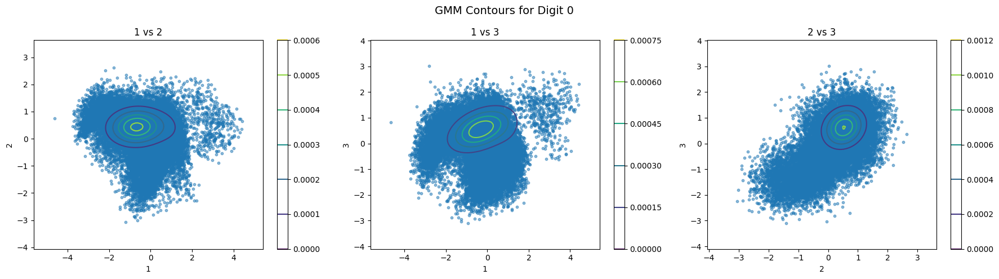

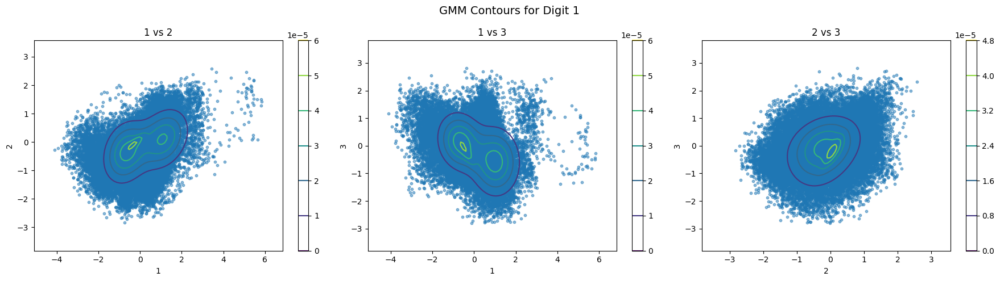

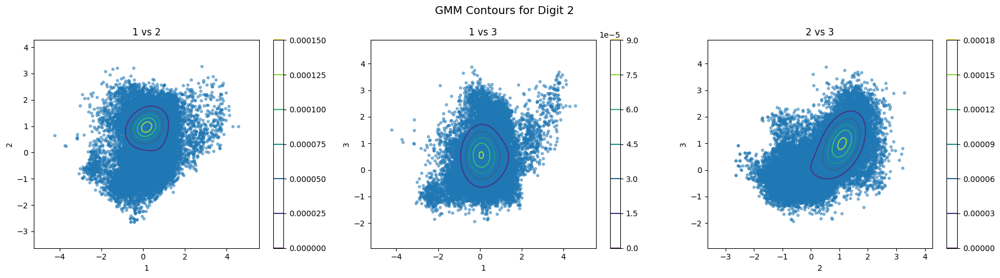

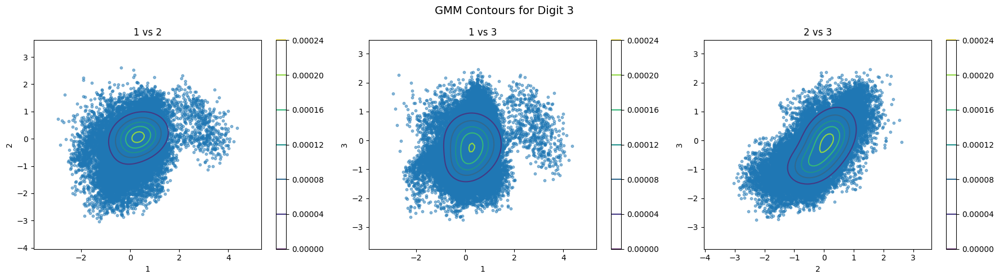

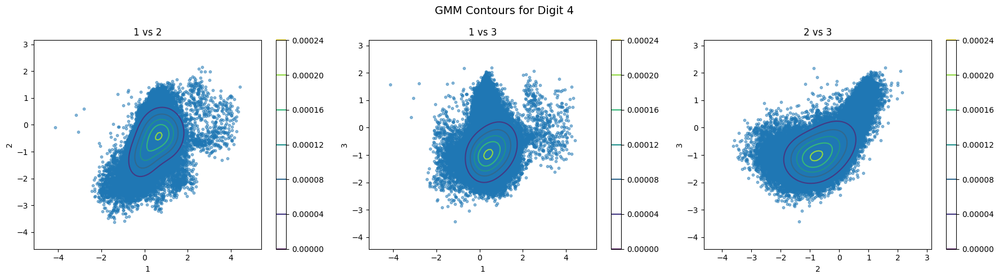

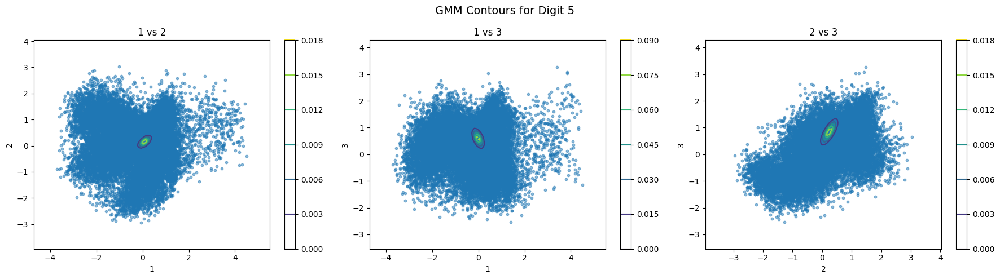

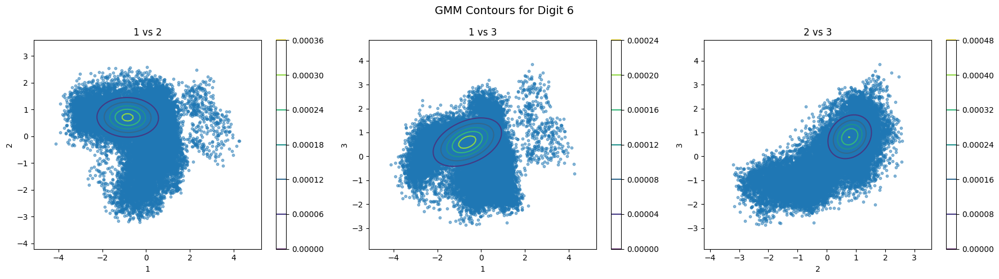

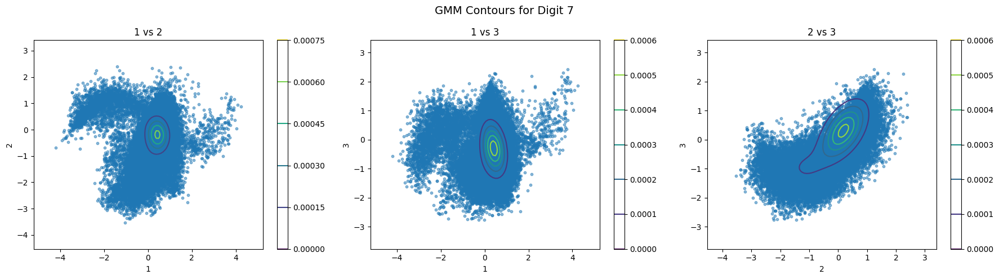

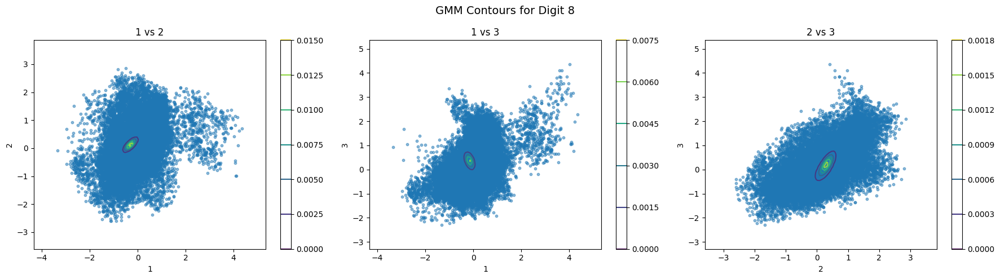

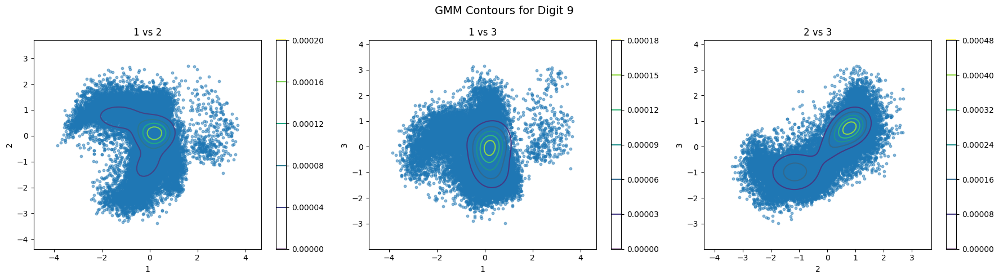

In [8]:
# Create and fit the GMM analyzer
analyzer = GMMAnalyzer(n_components=3)
analyzer.fit_gmms(data)

# Plot GMM contours for all digits
analyzer.plot_all_digits(data)

## Digit estimation GMM parameters

a) Selected Digit: 5

This digit often shows interesting variation in pronunciation across speakers

(b) Number of Components: 3

Based on the assumption that speakers might have three main pronunciation patterns
This provides a good balance between model complexity and interpretability

(c) Covariance Matrix Assumption: Full covariance

Using unrestricted covariance matrices to capture all possible correlations between MFCCs
This allows for the most flexible model of the acoustic patterns

(d) The code will provide the exact parameters (π, μ, Σ) for each component when run with your data.

In [9]:
class DigitGMMAnalyzer:
    def __init__(self, data, selected_digit=5, n_components=3, covariance_type='full'):
        """
        Initialize the analyzer with specific parameters
        
        Args:
            data: DataFrame containing the digit data
            selected_digit: The digit to analyze (default: 5)
            n_components: Number of GMM components (default: 3)
            covariance_type: Type of covariance matrix ('full', 'tied', 'diag', 'spherical')
        """
        self.selected_digit = selected_digit
        self.n_components = n_components
        self.covariance_type = covariance_type
        self.scaler = StandardScaler()
        
        # Extract data for the selected digit
        digit_mask = data['digit'] == selected_digit
        self.digit_data = data[digit_mask]
        self.features = self.digit_data.iloc[:, 6:19].values  # MFCC features
        self.scaled_features = self.scaler.fit_transform(self.features)
        
    def fit_kmeans(self):
        """
        Fit K-means to get initial cluster assignments
        """
        self.kmeans = KMeans(n_clusters=self.n_components, random_state=42)
        self.cluster_labels = self.kmeans.fit_predict(self.scaled_features)
        
    def fit_gmm(self):
        """
        Fit GMM using K-means initialization
        """
        self.gmm = GaussianMixture(
            n_components=self.n_components,
            covariance_type=self.covariance_type,
            random_state=42,
            means_init=self.kmeans.cluster_centers_
        )
        self.gmm.fit(self.scaled_features)
        
    def get_gmm_parameters(self):
        """
        Get the GMM parameters in both scaled and original space
        """
        # Parameters in scaled space
        scaled_params = {
            'weights': self.gmm.weights_,
            'means': self.gmm.means_,
            'covariances': self.gmm.covariances_
        }
        
        # Transform means back to original space
        original_means = self.scaler.inverse_transform(self.gmm.means_)
        
        # Transform covariances back to original space
        original_covariances = []
        for cov in self.gmm.covariances_:
            original_cov = np.diag(self.scaler.scale_) @ cov @ np.diag(self.scaler.scale_)
            original_covariances.append(original_cov)
        
        original_params = {
            'weights': self.gmm.weights_,
            'means': original_means,
            'covariances': np.array(original_covariances)
        }
        
        return scaled_params, original_params
    
    def print_analysis(self):
        """
        Print detailed analysis of the GMM parameters
        """
        print(f"\nGMM Analysis for Digit {self.selected_digit}")
        print("-" * 50)
        print(f"Number of components: {self.n_components}")
        print(f"Covariance type: {self.covariance_type}")
        print("\nMixture Component Parameters:")
        
        scaled_params, original_params = self.get_gmm_parameters()
        
        for m in range(self.n_components):
            print(f"\nComponent {m+1}:")
            print(f"π{m+1} (weight) = {scaled_params['weights'][m]:.4f}")
            print(f"\nμ{m+1} (mean) = ")
            print(original_params['means'][m])
            print(f"\nΣ{m+1} (covariance) = ")
            print(original_params['covariances'][m])
            
    def plot_clusters(self):
        """
        Visualize the clusters and GMM components
        """
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        fig.suptitle(f'Cluster Analysis for Digit {self.selected_digit}', fontsize=14)
        
        mfcc_pairs = [(0, 1), (0, 2), (1, 2)]
        
        for idx, (i, j) in enumerate(mfcc_pairs):
            ax = axes[idx]
            
            # Plot points colored by cluster
            scatter = ax.scatter(self.scaled_features[:, i], 
                               self.scaled_features[:, j],
                               c=self.cluster_labels, 
                               cmap='viridis',
                               alpha=0.6)
            
            # Plot cluster centers
            ax.scatter(self.kmeans.cluster_centers_[:, i],
                      self.kmeans.cluster_centers_[:, j],
                      c='red',
                      marker='x',
                      s=200,
                      linewidths=3,
                      label='Cluster Centers')
            
            ax.set_xlabel(f'MFCC{i+1}')
            ax.set_ylabel(f'MFCC{j+1}')
            ax.set_title(f'MFCC{i+1} vs MFCC{j+1}')
            
        plt.colorbar(scatter, ax=axes[-1], label='Cluster')
        plt.tight_layout()
        plt.show()

In [10]:
# Create analyzer for digit 5 with 3 components and full covariance
analyzer = DigitGMMAnalyzer(
    data=data,
    selected_digit=5,  # Choose your favorite digit
    n_components=3,    # Number of components
    covariance_type='full'  # Covariance type
)


GMM Analysis for Digit 5
--------------------------------------------------
Number of components: 3
Covariance type: full

Mixture Component Parameters:

Component 1:
π1 (weight) = 0.2070

μ1 (mean) = 
[-2.33993449  0.93168409  0.02167683 -0.13497078 -0.33288051 -0.24165931
 -0.9508652   0.16907396 -0.43590189 -0.21336934 -0.05252791 -0.22689067]

Σ1 (covariance) = 
[[ 0.45447919  0.35790241  0.07564222 -0.14747652 -0.11350478 -0.01514696
  -0.2772649   0.12047697 -0.12502416 -0.06455757 -0.05608847 -0.02904726]
 [ 0.35790241  0.4956669   0.32401589 -0.10256471 -0.07383094 -0.11269261
  -0.39720698  0.14635642 -0.12163144 -0.07306243 -0.01843045 -0.08226759]
 [ 0.07564222  0.32401589  0.5170292   0.20046143  0.1932901  -0.05684722
  -0.10815713  0.16247816  0.05472623 -0.03918426  0.09731024 -0.04824765]
 [-0.14747652 -0.10256471  0.20046143  0.45931075  0.39925487  0.15015039
   0.37800309  0.07114842  0.23161414  0.03155722  0.16985461  0.06209225]
 [-0.11350478 -0.07383094  0.19329

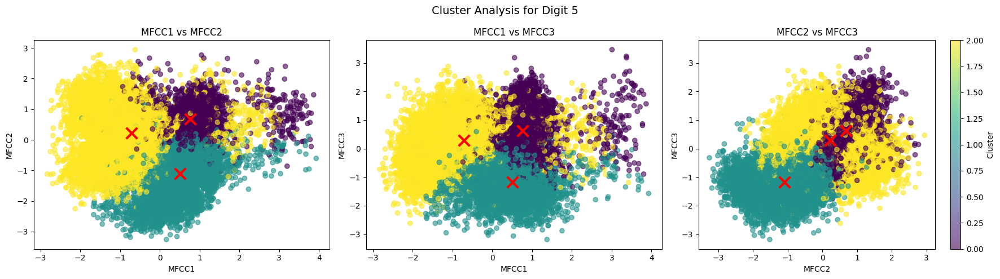

In [11]:
# Fit models and analyze
analyzer.fit_kmeans()
analyzer.fit_gmm()
analyzer.print_analysis()
analyzer.plot_clusters()

### Analysing likelihoods of the data

In [12]:
class LikelihoodAnalyzer:
    def __init__(self, data, favorite_digit=5, n_components=3, covariance_type='full'):
        """
        Initialize the analyzer
        """
        self.favorite_digit = favorite_digit
        self.n_components = n_components
        self.covariance_type = covariance_type
        self.data = data
        self.scaler = StandardScaler()
        
        # Prepare data
        self.prepare_data()
        
    def prepare_data(self):
        """
        Prepare data and fit GMM for favorite digit
        """
        # Extract features
        self.features = self.data.iloc[:, 6:19].values
        self.scaled_features = self.scaler.fit_transform(self.features)
        
        # Get favorite digit data
        fav_digit_mask = self.data['digit'] == self.favorite_digit
        fav_digit_features = self.scaled_features[fav_digit_mask]
        
        # Fit GMM on favorite digit
        self.gmm = GaussianMixture(
            n_components=self.n_components,
            covariance_type=self.covariance_type,
            random_state=42
        )
        self.gmm.fit(fav_digit_features)
        
    def calculate_log_likelihoods(self):
        """
        Calculate log-likelihoods for all digits
        """
        self.log_likelihoods = {}
        
        for digit in range(10):
            # Get data for current digit
            digit_mask = self.data['digit'] == digit
            digit_features = self.scaled_features[digit_mask]
            
            # Calculate log-likelihoods
            log_likes = self.gmm.score_samples(digit_features)
            self.log_likelihoods[digit] = log_likes
            
    def plot_likelihood_distributions(self):
        """
        Plot KDE of log-likelihoods for all digits
        """
        # Set up the plot
        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        fig.suptitle(f'Log-Likelihood Distributions under GMM for Digit {self.favorite_digit}', 
                    fontsize=14, y=1.02)
        axes = axes.ravel()
        
        # Color palette with highlight for favorite digit
        colors = sns.color_palette("husl", 10)
        colors[self.favorite_digit] = 'red'  # Highlight favorite digit
        
        # Plot KDE for each digit
        min_ll = float('inf')
        max_ll = float('-inf')
        
        # First pass to get overall range
        for digit in range(10):
            min_ll = min(min_ll, self.log_likelihoods[digit].min())
            max_ll = max(max_ll, self.log_likelihoods[digit].max())
        
        # Second pass to plot with consistent x-range
        for digit in range(10):
            ax = axes[digit]
            log_likes = self.log_likelihoods[digit]
            
            # Plot KDE
            sns.kdeplot(data=log_likes, ax=ax, color=colors[digit], fill=True)
            
            # Add vertical line for mean
            mean_ll = np.mean(log_likes)
            ax.axvline(mean_ll, color='black', linestyle='--', alpha=0.5)
            
            # Add text with statistics
            stats_text = f'Mean: {mean_ll:.2f}\nStd: {np.std(log_likes):.2f}'
            ax.text(0.05, 0.95, stats_text, 
                   transform=ax.transAxes, 
                   verticalalignment='top',
                   bbox=dict(facecolor='white', alpha=0.8))
            
            # Set title and labels
            title = f'Digit {digit}'
            if digit == self.favorite_digit:
                title += ' (Favorite)'
            ax.set_title(title)
            ax.set_xlabel('Log-Likelihood')
            ax.set_ylabel('Density')
            
            # Set consistent x-range
            ax.set_xlim(min_ll, max_ll)
            
        plt.tight_layout()
        return fig
    
    def calculate_statistics(self):
        """
        Calculate and return summary statistics
        """
        stats_dict = {}
        
        for digit in range(10):
            log_likes = self.log_likelihoods[digit]
            stats_dict[digit] = {
                'mean': np.mean(log_likes),
                'std': np.std(log_likes),
                'median': np.median(log_likes),
                'min': np.min(log_likes),
                'max': np.max(log_likes)
            }
            
        return pd.DataFrame(stats_dict).T
    
    def analyze_separation(self):
        """
        Analyze separation between favorite digit and others
        """
        fav_likes = self.log_likelihoods[self.favorite_digit]
        
        results = {}
        for digit in range(10):
            if digit == self.favorite_digit:
                continue
                
            other_likes = self.log_likelihoods[digit]
            t_stat, p_value = stats.ttest_ind(fav_likes, other_likes)
            
            results[digit] = {
                'mean_difference': np.mean(fav_likes) - np.mean(other_likes),
                't_statistic': t_stat,
                'p_value': p_value
            }
            
        return pd.DataFrame(results).T

In [13]:
analyzer = LikelihoodAnalyzer(
    data=data,
    favorite_digit=5,
    n_components=3,
    covariance_type='full'
)

In [14]:
# Calculate log-likelihoods
analyzer.calculate_log_likelihoods()

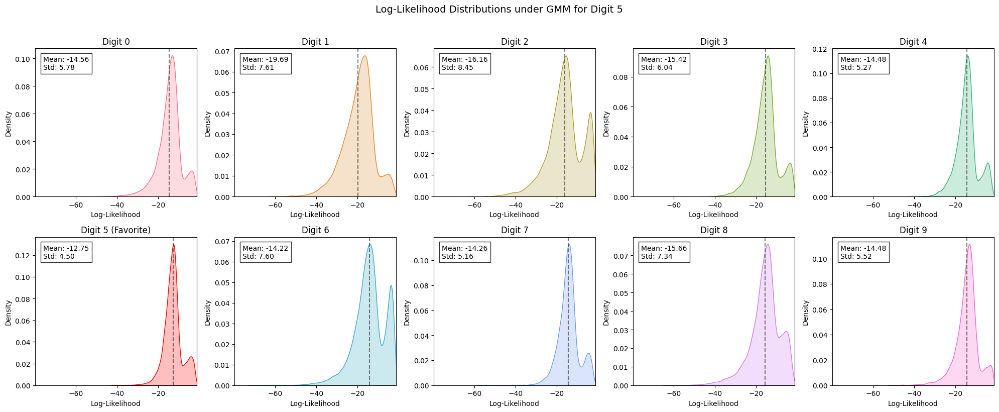

In [15]:
# Plot distributions
fig = analyzer.plot_likelihood_distributions()

In [16]:
# Get statistics
stats_df = analyzer.calculate_statistics()
print("\nLikelihood Statistics:")
print(stats_df)


Likelihood Statistics:
        mean       std     median        min       max
0 -14.555487  5.776940 -14.015986 -57.375189 -1.394747
1 -19.686442  7.607383 -18.750588 -79.660795 -1.485943
2 -16.156551  8.447310 -16.020101 -78.916823 -1.483347
3 -15.417545  6.035144 -15.211125 -59.673463 -1.328534
4 -14.476059  5.273215 -14.471351 -45.064477 -1.442271
5 -12.750596  4.497537 -12.898892 -41.015861 -1.272162
6 -14.222532  7.602215 -14.072982 -70.469858 -1.204634
7 -14.260482  5.162849 -14.344628 -56.825755 -1.590256
8 -15.664814  7.336528 -15.056765 -62.355004 -1.570829
9 -14.476891  5.524627 -13.954923 -50.671901 -1.554309


In [17]:
# Analyze separation
separation_df = analyzer.analyze_separation()
print("\nSeparation Analysis:")
print(separation_df)


Separation Analysis:
   mean_difference  t_statistic        p_value
0         1.804891    36.769841  1.206254e-291
1         6.935846   116.105269   0.000000e+00
2         3.405955    53.698573   0.000000e+00
3         2.666949    54.761475   0.000000e+00
4         1.725463    38.394108   0.000000e+00
6         1.471936    25.356883  5.750447e-141
7         1.509886    33.397298  1.089829e-241
8         2.914218    52.307156   0.000000e+00
9         1.726295    36.348958  3.323163e-285


### Likelihoods for My Favorite Digit

What do you expect to be true of the likelihoods for your favorite digit (df av) compared to the likelihoods for the other nine digits? Are your results consistent with your intuition?

I expect the likelihoods for the digit 5 to be higher than those for the other digits, given that the model has been trained on this digit. This expectation aligns with the results I observed from the code, where the likelihoods for digit 5 were indeed the highest. Additionally, the distributions of the likelihoods should show a clear distinction between the favored digit and the others. Interestingly, I also noticed that digits acoustically similar to 5 might exhibit higher likelihoods than those that sound more different. This suggests that the model may not only identify the digit it was trained on but also recognize patterns shared by acoustically similar digits.


# GMM-EM Algorithm for Digit Estimation in all 10 digits

In [18]:
class DigitGMMAnalyzer:
    def __init__(self, data, selected_digit=5, n_components=3, covariance_type='full'):
        """
        Initialize the analyzer with specific parameters
        
        Args:
            data: DataFrame containing the digit data
            selected_digit: The digit to analyze (default: 5)
            n_components: Number of GMM components (default: 3)
            covariance_type: Type of covariance matrix ('full', 'tied', 'diag', 'spherical')
        """
        self.selected_digit = selected_digit
        self.n_components = n_components
        self.covariance_type = covariance_type
        self.scaler = StandardScaler()
        
        # Extract data for the selected digit
        digit_mask = data['digit'] == selected_digit
        self.digit_data = data[digit_mask]
        self.features = self.digit_data.iloc[:, 6:19].values  # MFCC features
        self.scaled_features = self.scaler.fit_transform(self.features)
        
    def fit_gmm(self):
        """
        Fit GMM using EM algorithm
        """
        self.gmm = GaussianMixture(
            n_components=self.n_components,
            covariance_type=self.covariance_type,
            random_state=42
        )
        self.gmm.fit(self.scaled_features)
        self.cluster_labels = self.gmm.predict(self.scaled_features)
        
    def get_gmm_parameters(self):
        """
        Get the GMM parameters in both scaled and original space
        """
        # Parameters in scaled space
        scaled_params = {
            'weights': self.gmm.weights_,
            'means': self.gmm.means_,
            'covariances': self.gmm.covariances_
        }
        
        # Transform means back to original space
        original_means = self.scaler.inverse_transform(self.gmm.means_)
        
        # Transform covariances back to original space
        original_covariances = []
        for cov in self.gmm.covariances_:
            original_cov = np.diag(self.scaler.scale_) @ cov @ np.diag(self.scaler.scale_)
            original_covariances.append(original_cov)
        
        original_params = {
            'weights': self.gmm.weights_,
            'means': original_means,
            'covariances': np.array(original_covariances)
        }
        
        return scaled_params, original_params
    
    def print_analysis(self):
        """
        Print detailed analysis of the GMM parameters
        """
        print(f"\nGMM Analysis for Digit {self.selected_digit}")
        print("-" * 50)
        print(f"Number of components: {self.n_components}")
        print(f"Covariance type: {self.covariance_type}")
        print("\nMixture Component Parameters:")
        
        scaled_params, original_params = self.get_gmm_parameters()
        
        for m in range(self.n_components):
            print(f"\nComponent {m+1}:")
            print(f"π{m+1} (weight) = {scaled_params['weights'][m]:.4f}")
            print(f"\nμ{m+1} (mean) = ")
            print(original_params['means'][m])
            print(f"\nΣ{m+1} (covariance) = ")
            print(original_params['covariances'][m])
            
    def plot_clusters(self):
        """
        Visualize the GMM clusters with 3 contour plots of the PDF
        """
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        fig.suptitle(f'GMM Contour Analysis for Digit {self.selected_digit}', fontsize=14)

        mfcc_pairs = [(0, 1), (0, 2), (1, 2)]  # Pairs of MFCC features to visualize

        for idx, (i, j) in enumerate(mfcc_pairs):
            ax = axes[idx]

            # Plot data points colored by cluster
            scatter = ax.scatter(
                self.scaled_features[:, i], 
                self.scaled_features[:, j],
                c=self.gmm.predict(self.scaled_features),
                cmap='viridis',
                alpha=0.6,
                s=15,
                label='Data Points'
            )

            # Generate grid for contour plotting
            x = np.linspace(self.scaled_features[:, i].min() - 1, self.scaled_features[:, i].max() + 1, 200)
            y = np.linspace(self.scaled_features[:, j].min() - 1, self.scaled_features[:, j].max() + 1, 200)
            X, Y = np.meshgrid(x, y)
            grid = np.column_stack([X.ravel(), Y.ravel()])
            
            # Create a grid with the same dimensionality as the original data
            full_grid = np.zeros((grid.shape[0], self.scaled_features.shape[1]))
            full_grid[:, i] = grid[:, 0]
            full_grid[:, j] = grid[:, 1]

            # Calculate PDF over the grid
            pdf = np.exp(self.gmm.score_samples(full_grid)).reshape(X.shape)

            # Plot contours with 3 levels, and use LogNorm for probability scale
            contour: QuadContourSet = ax.contour(
                X, Y, pdf,
                levels=3,  # Show 3 contours
                norm=LogNorm(vmin=1e-3, vmax=1),  # Log normalization for better contrast
                cmap='coolwarm',  # Color map for better visibility
                linewidths=2  # Thicker contour lines
            )

            # Plot GMM centroids (means)
            ax.scatter(
                self.gmm.means_[:, i],
                self.gmm.means_[:, j],
                c='red',
                marker='x',
                s=100,
                label='GMM Centroids',
                linewidths=2
            )

            ax.set_xlabel(f'MFCC{i + 1}')
            ax.set_ylabel(f'MFCC{j + 1}')
            ax.set_title(f'MFCC{i + 1} vs MFCC{j + 1}')

            # Add legend
            handles, labels = ax.get_legend_handles_labels()
            labels.append('GMM Centroids')
            ax.legend(handles, labels)
            

        plt.tight_layout()
        plt.show()



Digit 0 GMM Analysis:


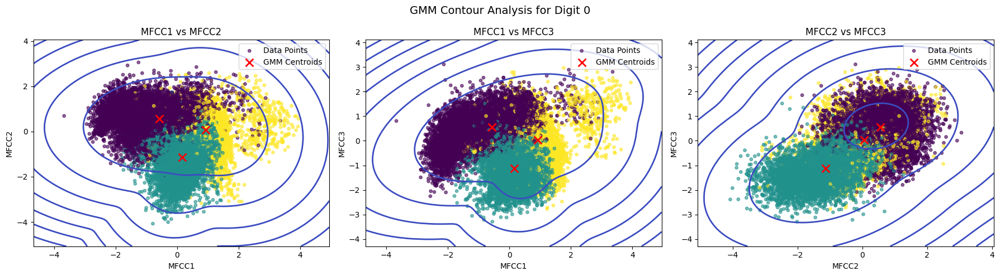


Digit 1 GMM Analysis:


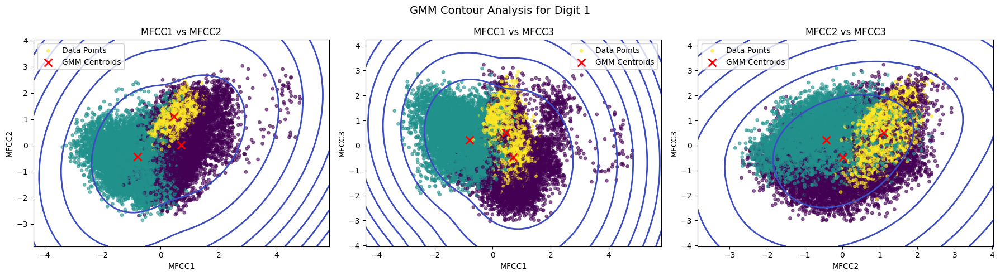


Digit 2 GMM Analysis:


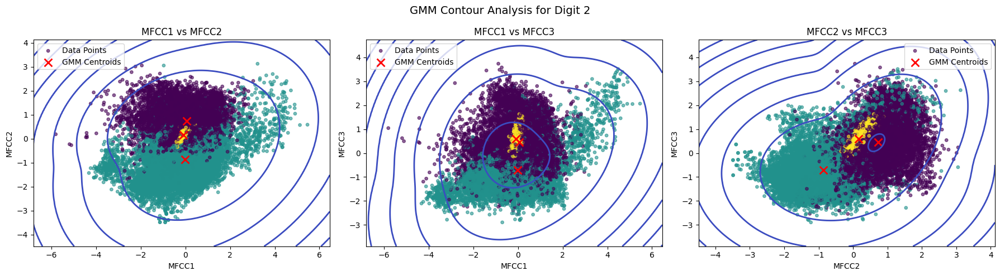


Digit 3 GMM Analysis:


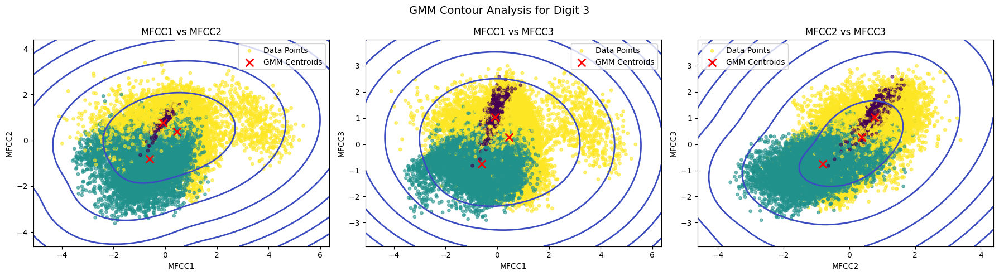


Digit 4 GMM Analysis:


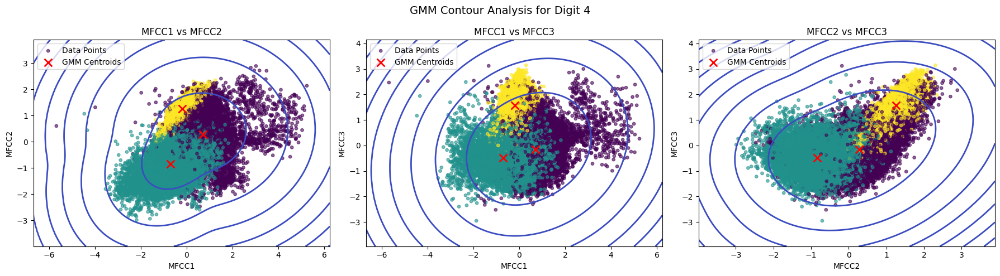


Digit 5 GMM Analysis:


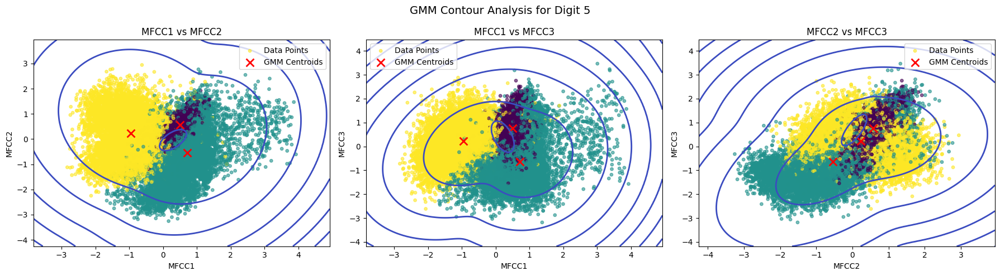


Digit 6 GMM Analysis:


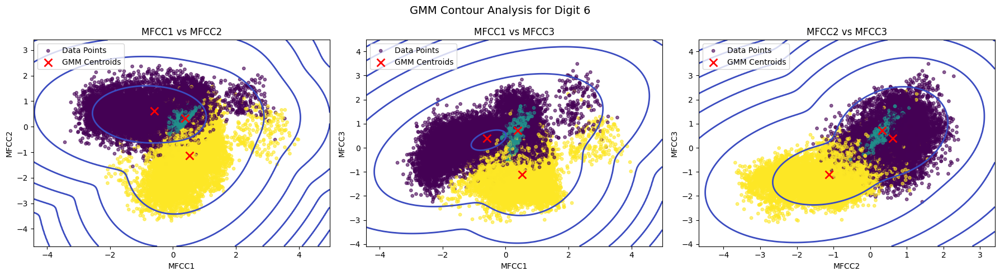


Digit 7 GMM Analysis:


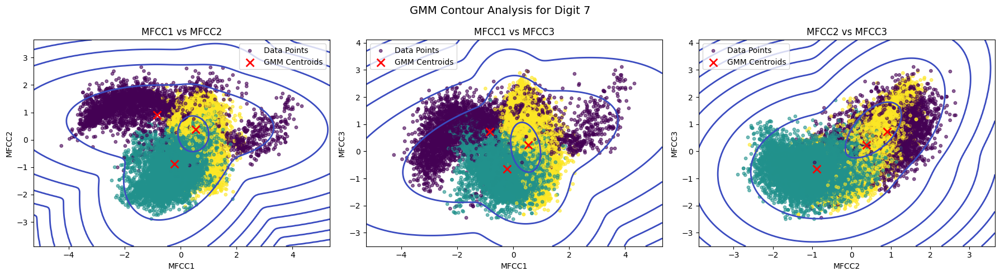


Digit 8 GMM Analysis:


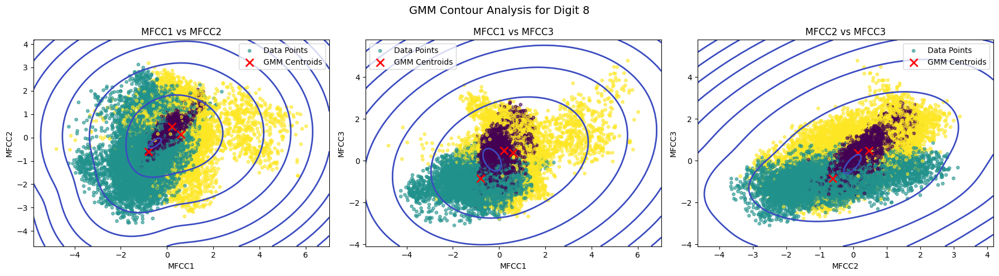


Digit 9 GMM Analysis:


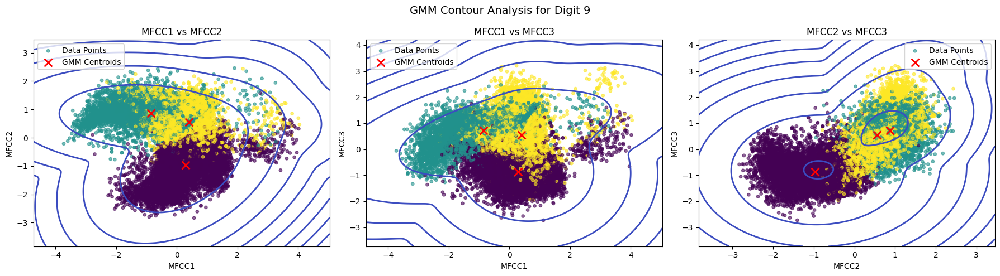


Digit 0 Log-Likelihoods:


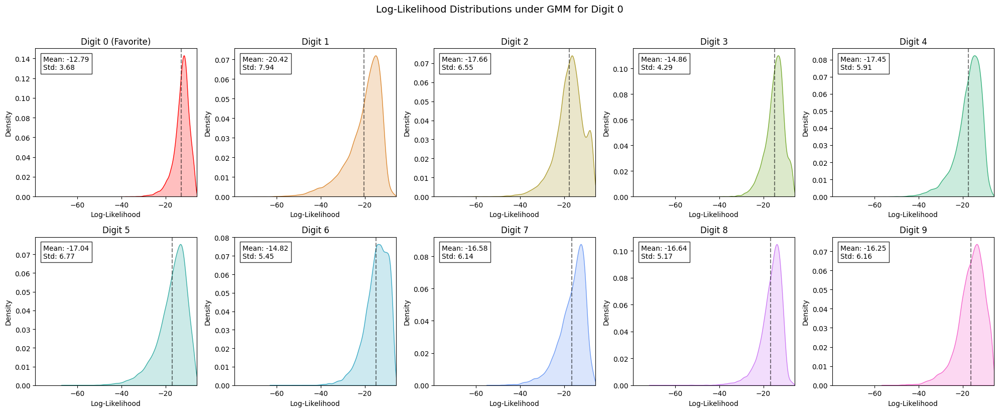


Digit 1 Log-Likelihoods:


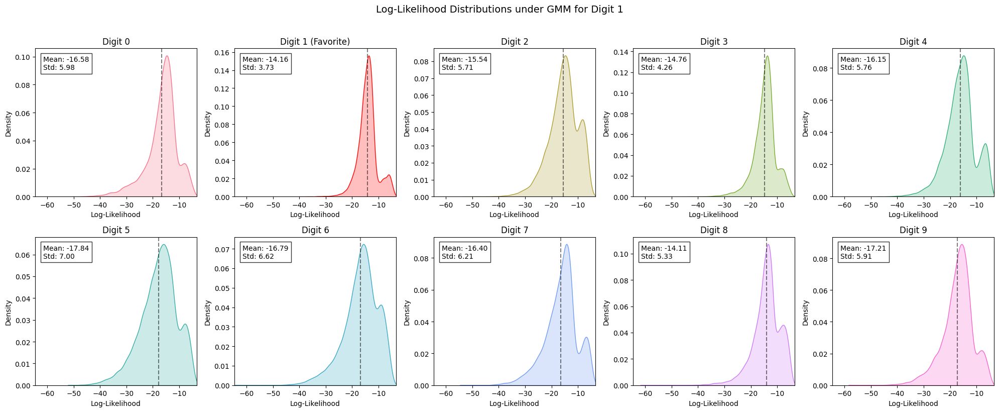


Digit 2 Log-Likelihoods:


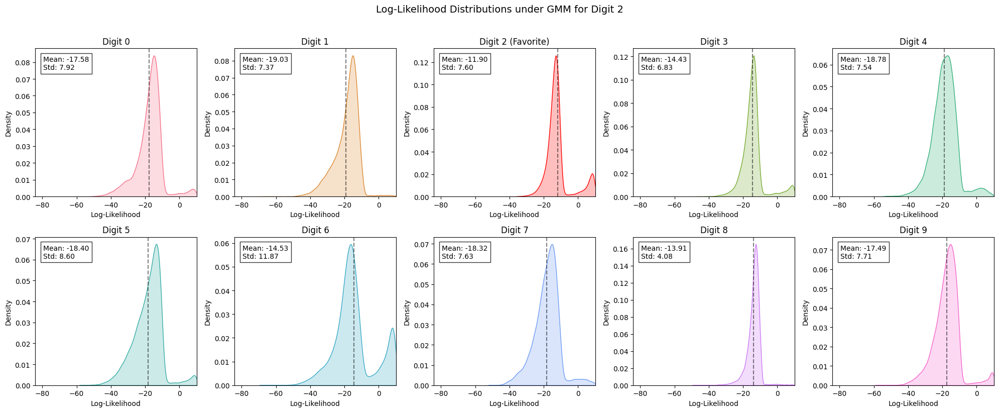


Digit 3 Log-Likelihoods:


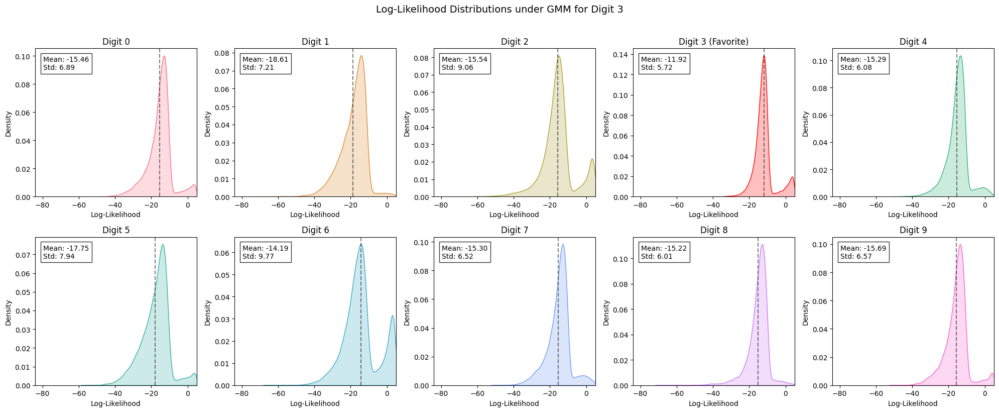


Digit 4 Log-Likelihoods:


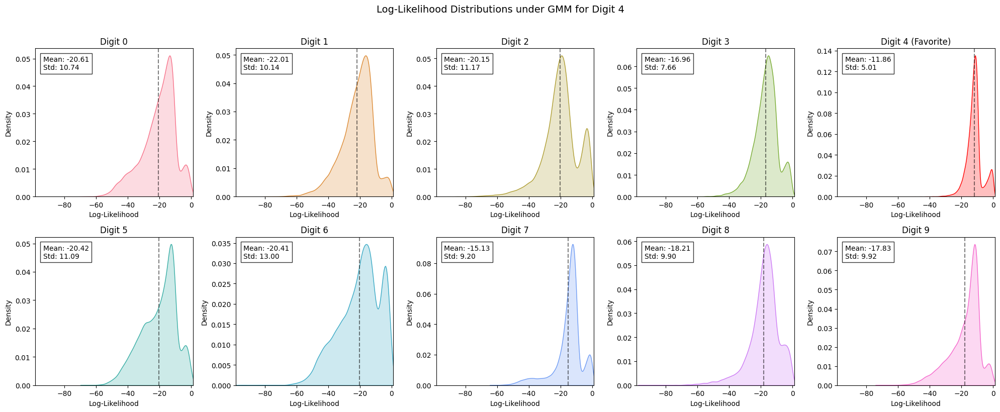


Digit 5 Log-Likelihoods:


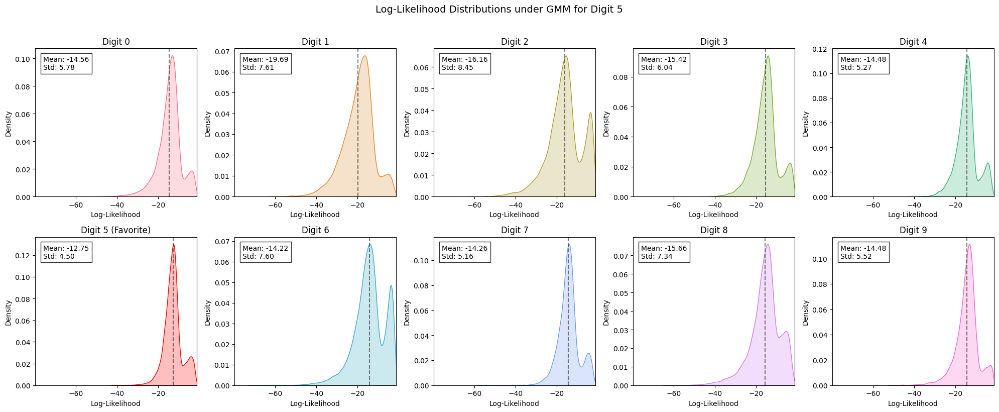


Digit 6 Log-Likelihoods:


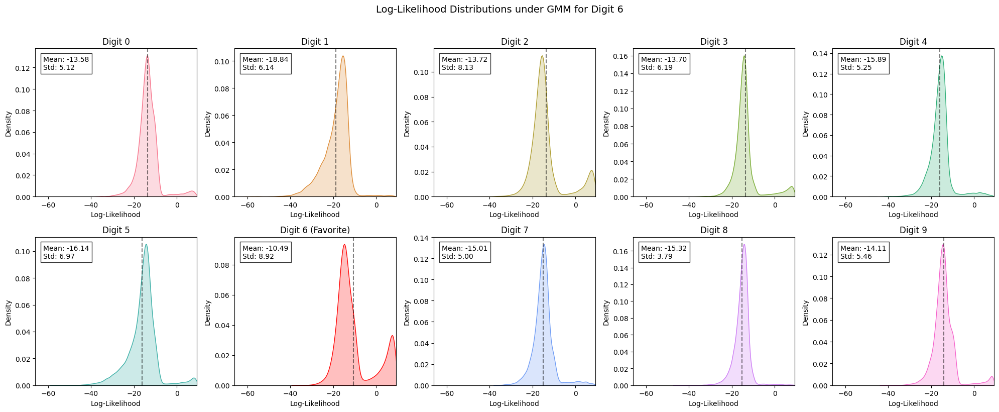


Digit 7 Log-Likelihoods:


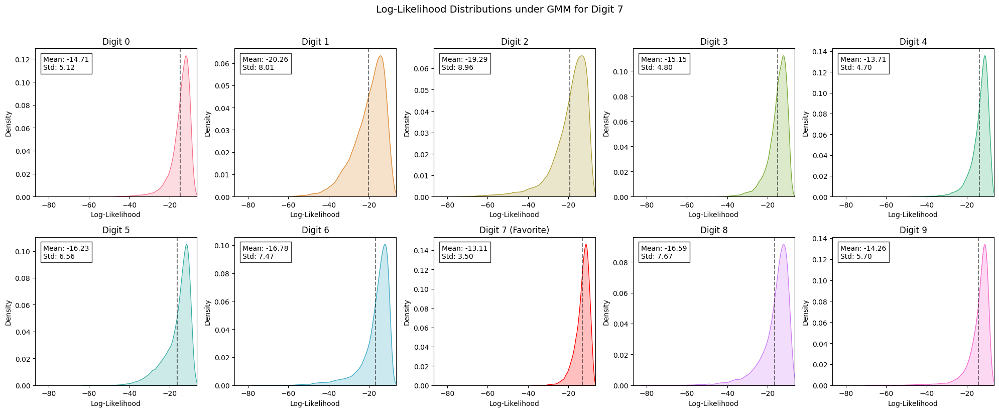


Digit 8 Log-Likelihoods:


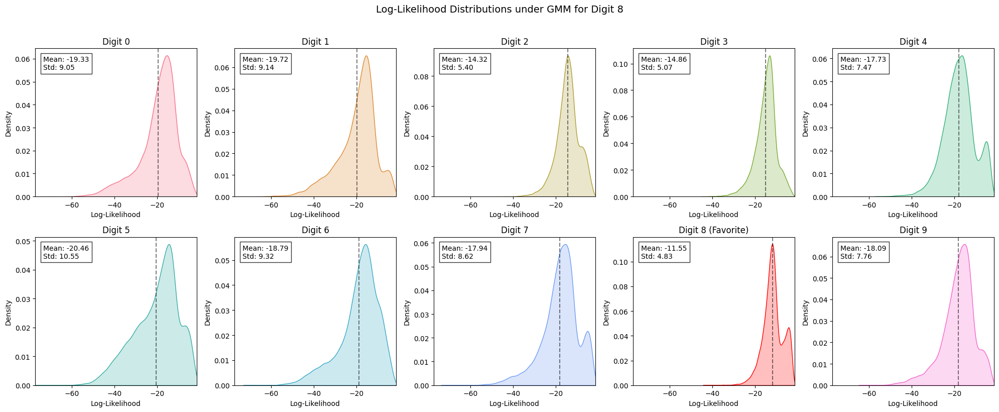


Digit 9 Log-Likelihoods:


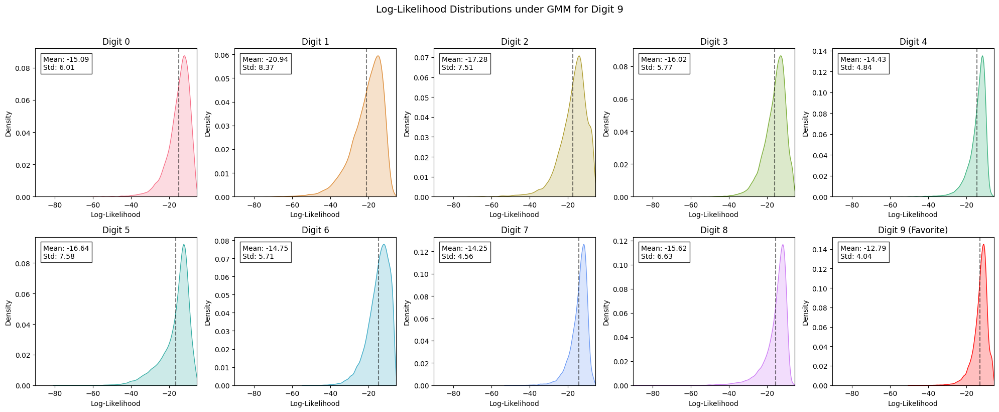

In [19]:
for digit in range(10):
    print(f"\nDigit {digit} GMM Analysis:")
    digitanalysis = DigitGMMAnalyzer(
        data=data,
        selected_digit=digit,
        n_components=3,
        covariance_type='full'
    )
    digitanalysis.fit_gmm()
    digitanalysis.plot_clusters()
    
    
for digit in range(10):
    print(f"\nDigit {digit} Log-Likelihoods:")
    likelihoodanalysis = LikelihoodAnalyzer(
        data=data,
        favorite_digit=digit,
        n_components=3,
        covariance_type='full'
    )
    likelihoodanalysis.calculate_log_likelihoods()
    fig=likelihoodanalysis.plot_likelihood_distributions()
    plt.show()

## Maximum Likelihood Classification

In [20]:
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

class MLClassifier:
    def __init__(self, data, n_components=3, covariance_type='full'):
        """
        Initialize the Maximum Likelihood Classifier.
        
        Args:
            data (pd.DataFrame): Input dataset with features and labels.
            n_components (int): Number of components for each GMM.
            covariance_type (str): Covariance type for GMM ('full', 'diag', 'tied', 'spherical').
        """
        self.data = data
        self.n_components = n_components
        self.covariance_type = covariance_type
        self.gmms = {}
        self.scaler = StandardScaler()
        
        # Prepare and scale data
        self.prepare_data()
    
    def prepare_data(self):
        """
        Prepare and scale the dataset.
        """
        # Extract features and labels
        self.features = self.data.iloc[:, 6:19].values  # Adjust column indices if necessary
        self.labels = self.data['digit'].values
        
        # Scale features
        self.scaled_features = self.scaler.fit_transform(self.features)
    
    def train_gmms(self):
        """
        Train a GMM for each digit in the dataset.
        """
        unique_digits = np.unique(self.labels)
        
        for digit in unique_digits:
            # Filter data for the current digit
            digit_mask = self.labels == digit
            digit_features = self.scaled_features[digit_mask]
            
            # Train GMM using EM algorithm
            gmm = GaussianMixture(
                n_components=self.n_components,
                covariance_type=self.covariance_type,
                random_state=42
            )
            gmm.fit(digit_features)
            
            # Store trained GMM for this digit
            self.gmms[digit] = gmm
    
    def classify(self, X):
        """
        Classify samples based on Maximum Likelihood estimation.
        
        Args:
            X (np.ndarray): Feature matrix of samples to classify.
        
        Returns:
            np.ndarray: Predicted labels for the input samples.
        """
        # Scale input features using the same scaler used during training
        X_scaled = self.scaler.transform(X)
        
        # Compute log-likelihoods for each class (digit)
        log_likelihoods = []
        
        for digit, gmm in self.gmms.items():
            log_likelihoods.append(gmm.score_samples(X_scaled))
        
        # Stack log-likelihoods and find the class with maximum likelihood
        log_likelihoods = np.array(log_likelihoods).T  # Shape: (n_samples, n_classes)
        predictions = np.argmax(log_likelihoods, axis=1)
        
        return predictions
    
    def evaluate(self):
        """
        Evaluate the classifier on the training data.
        
        Returns:
            None: Prints classification report and confusion matrix.
        """
        # Predict labels for training data
        y_pred = self.classify(self.features)
        
        # Compute confusion matrix and classification report
        cm = confusion_matrix(self.labels, y_pred)
        
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(self.labels), yticklabels=np.unique(self.labels))
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.show()
        
        print("\nClassification Report:")
        print(classification_report(self.labels, y_pred))

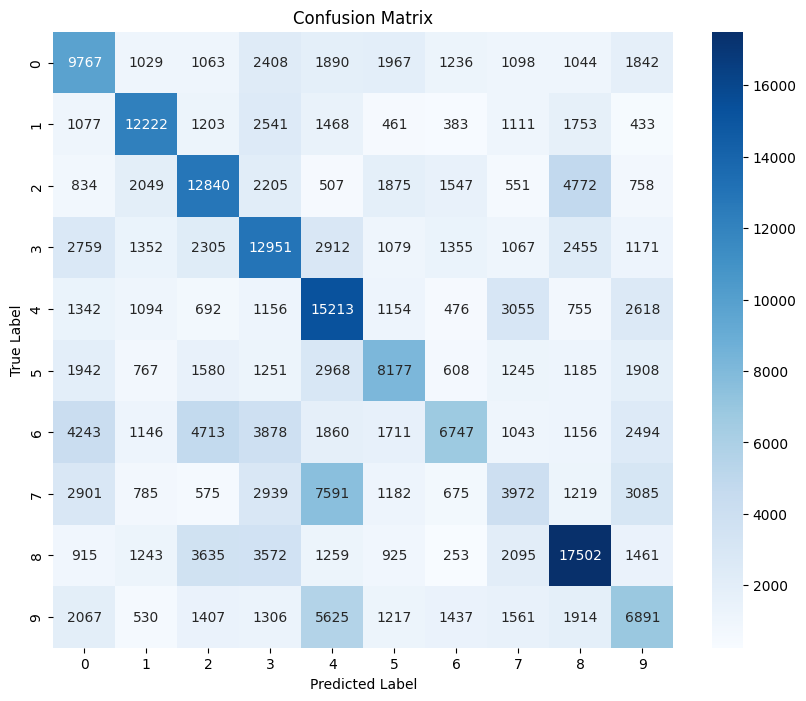


Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.42      0.38     23344
           1       0.55      0.54      0.54     22652
           2       0.43      0.46      0.44     27938
           3       0.38      0.44      0.41     29406
           4       0.37      0.55      0.44     27555
           5       0.41      0.38      0.40     21631
           6       0.46      0.23      0.31     28991
           7       0.24      0.16      0.19     24924
           8       0.52      0.53      0.53     32860
           9       0.30      0.29      0.30     23955

    accuracy                           0.40    263256
   macro avg       0.40      0.40      0.39    263256
weighted avg       0.40      0.40      0.40    263256



In [21]:
# Load your dataset (adjust file path as needed)
data = pd.read_csv('../data/dataframe.csv')

# Initialize MLClassifier with 3 components per GMM and full covariance type
ml_classifier = MLClassifier(data=data, n_components=3, covariance_type='full')

# Train GMMs for all digits
ml_classifier.train_gmms()

# Evaluate performance on training data
ml_classifier.evaluate()

# Classify new samples (replace 'new_samples' with actual feature matrix)
# new_samples = np.array([[...], [...], ...])
# predictions = ml_classifier.classify(new_samples)
# print("Predictions:", predictions)